In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# Cell 1: Install minimal packages & imports (run once)
!pip install ftfy regex tqdm --quiet
!pip install git+https://github.com/openai/CLIP.git --quiet
!pip install easyocr --quiet

import os, json, time
from pathlib import Path
import numpy as np
import pandas as pd
import torch, clip
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

# Device
\
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# Load CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()
print("CLIP loaded.")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 89.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 33.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.4 MB/s eta 0:00

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 182MiB/s]


CLIP loaded.


In [3]:
# Cell 2: Dataset paths - update if your folder names differ
IMG_DIR  = "/kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1"
JSON_DIR = "/kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1"

# Example uploaded image (you used this earlier)
EXAMPLE_UPLOADED_IMG = "/kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/00690.jpg"

print("Image dir exists:", Path(IMG_DIR).exists())
print("JSON dir exists:", Path(JSON_DIR).exists())
print("Uploaded sample exists:", Path(EXAMPLE_UPLOADED_IMG).exists())


Image dir exists: True
JSON dir exists: True
Uploaded sample exists: True


In [4]:
# Cell 3: Metadata loader & simple brand extraction
def load_metadata(json_path):
    with open(json_path, "r") as f:
        jd = json.load(f)
    items = []
    for asin, data in jd.get("BIN_FCSKU_DATA", {}).items():
        items.append({
            "asin": asin,
            "name": data.get("name","").strip(),
            "qty": int(data.get("quantity", 1))
        })
    return items

def extract_brand(name):
    # simple heuristic: first capitalized token or first token
    parts = [p.strip(",") for p in name.split() if p.strip()]
    for p in parts:
        if p and p[0].isupper():
            return p.lower()
    return parts[0].lower() if parts else ""


In [5]:

# Cell 4: Extract patches (returns raw_patches (numpy), clip_embs (N,512), coords)
def extract_patches(img_path, grid=(6,6)):
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    gx, gy = grid
    pw, ph = W // gx, H // gy

    raw_patches = []
    clip_tensors = []
    coords = []

    for i in range(gy):
        for j in range(gx):
            x1, y1 = j*pw, i*ph
            x2, y2 = x1+pw, y1+ph
            patch = img.crop((x1,y1,x2,y2))
            raw_patches.append(np.array(patch))              # for OCR
            clip_tensors.append(preprocess(patch).to(device))# for CLIP
            coords.append((x1,y1,x2,y2))

    # CLIP encode
    with torch.no_grad():
        clip_batch = torch.stack(clip_tensors)
        emb = model.encode_image(clip_batch).float()
        emb /= emb.norm(dim=-1, keepdim=True)
    clip_embs = emb.cpu().numpy()
    return raw_patches, clip_embs, coords


In [7]:

!apt-get update -qq
!apt-get install -y tesseract-ocr -qq
!pip install pytesseract --quiet

import pytesseract

def detect_brand_global(img_path, brand):
    img = Image.open(img_path).convert("RGB")
    text = pytesseract.image_to_string(img)
    return brand.lower() in text.lower()

def detect_brand_in_patches(raw_patches, brand):
    hits = 0
    b = brand.lower()
    for p in raw_patches:
        text = pytesseract.image_to_string(Image.fromarray(p))
        if b in text.lower():
            hits += 1
    return hits



W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [8]:

def get_text_embedding(asin, name):
    prompt = f"Retail product in an Amazon fulfillment center bin, possibly wrapped or occluded: {name}"
    tokens = clip.tokenize([prompt]).to(device)
    with torch.no_grad():
        t = model.encode_text(tokens).float()
        t /= t.norm(dim=-1, keepdim=True)
    return t  # torch tensor on device

def match_asin(clip_embs, text_emb, required_qty, threshold=0.30):
    """
    clip_embs: numpy (N,512)
    text_emb: torch tensor (1,512) on device
    """
    text_vec = text_emb.cpu().numpy().squeeze()
    sims = clip_embs @ text_vec  # (N,)
    max_sim = float(sims.max())
    # patches with similarity above threshold
    patch_hits = int((sims >= threshold).sum())
    predicted_qty = 1 if max_sim >= threshold else 0
    passed = predicted_qty >= required_qty
    return {"predicted_qty": predicted_qty, "max_similarity": max_sim, "patch_hits": patch_hits, "pass": passed}


In [9]:
# Cell 7: Combined verification logic + image display
def show_bin_image(img_path, size=(6,6)):
    img = Image.open(img_path).convert("RGB")
    plt.figure(figsize=size); plt.imshow(img); plt.axis("off")
    plt.title(f"Bin Image: {Path(img_path).name}", fontsize=14); plt.show()

def verify_bin(bin_img, bin_json, grid=(6,6), threshold=0.30):
    items = load_metadata(bin_json)
    raw_patches, clip_embs, coords = extract_patches(bin_img, grid=grid)
    results = []
    for it in items:
        asin = it["asin"]; name = it["name"]; req = it["qty"]
        brand = extract_brand(name)
        text_emb = get_text_embedding(asin, name)
        clip_match = match_asin(clip_embs, text_emb, req, threshold=threshold)

        # OCR override logic
        # 1) global OCR strong override:
        if brand and detect_brand_global(bin_img, brand):
            clip_match["predicted_qty"] = req
            clip_match["pass"] = True
            clip_match["ocr_hits"] = "global"
        else:
            # 2) patch OCR fallback: add hits if any
            ocr_hits = detect_brand_in_patches(raw_patches, brand) if brand else 0
            clip_match["ocr_hits"] = int(ocr_hits)
            if ocr_hits > 0:
                clip_match["predicted_qty"] = max(clip_match.get("predicted_qty",0), ocr_hits)
                clip_match["pass"] = clip_match["predicted_qty"] >= req

        results.append({
            "asin": asin,
            "name": name,
            "required_qty": req,
            **clip_match
        })

    overall = all(r["pass"] for r in results)
    return results, overall


In [10]:

def print_verification_results(results, overall):
    df = pd.DataFrame(results)[["asin","name","required_qty","predicted_qty","patch_hits","ocr_hits","max_similarity","pass"]]
    if "max_similarity" in df.columns:
        df["max_similarity"] = df["max_similarity"].round(3)
    display(df)
    print("\nOVERALL:", "✔ PASS" if overall else "❌ FAIL")


In [12]:


def extract_patches(img_path, grid=(6,6)):
    """
    Extracts patches from the bin image.
    Returns:
        raw_patches: numpy arrays for OCR
        clip_embs: CLIP embeddings (numpy vectors)
        coords: bounding boxes of patches
    """
  
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    gx, gy = grid

    patch_w = W // gx
    patch_h = H // gy

    raw_patches = []       
    clip_emb_tensors = []  
    coords = []

   
    for iy in range(gy):
        for ix in range(gx):
            x1 = ix * patch_w
            y1 = iy * patch_h
            x2 = x1 + patch_w
            y2 = y1 + patch_h

            patch = img.crop((x1, y1, x2, y2))   

            raw_patches.append(np.array(patch))

            clip_tensor = preprocess(patch).unsqueeze(0).to(device)
            clip_emb_tensors.append(clip_tensor)

            coords.append((x1, y1, x2, y2))

    clip_embs = []
    with torch.no_grad():
        for t in clip_emb_tensors:
            emb = model.encode_image(t).float().cpu().numpy()
            clip_embs.append(emb)

    return raw_patches, clip_embs, coords

print("✔ extract_patches() successfully replaced.")


✔ extract_patches() successfully replaced.


In [15]:
import clip
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

model, preprocess = clip.load("ViT-B/32", device=device)

print("✔ CLIP preprocess reset and fixed.")


✔ CLIP preprocess reset and fixed.


In [16]:
def extract_patches(img_path, grid=(6,6)):
    """
    Extracts patches and computes CLIP embeddings.
    Ensures patches are PIL images for preprocess().
    """

    # Force open image cleanly
    img = Image.open(img_path).convert("RGB")

    W, H = img.size
    gx, gy = grid

    pw = W // gx
    ph = H // gy

    raw_patches = []
    clip_embs = []
    coords = []

    for iy in range(gy):
        for ix in range(gx):
            x1, y1 = ix * pw, iy * ph
            x2, y2 = x1 + pw, y1 + ph

            patch = img.crop((x1, y1, x2, y2))     # <-- always PIL
            raw_patches.append(np.array(patch))    # for OCR

            # CLIP preprocess ALWAYS expects PIL
            patch_tensor = preprocess(patch).unsqueeze(0).to(device)

            with torch.no_grad():
                emb = model.encode_image(patch_tensor).float().cpu().numpy()

            clip_embs.append(emb)
            coords.append((x1, y1, x2, y2))

    return raw_patches, clip_embs, coords

print("✔ extract_patches() replaced successfully.")


✔ extract_patches() replaced successfully.


In [18]:
import torch
from PIL import Image
import numpy as np

# CLIP mean/std
CLIP_MEAN = (0.48145466, 0.4578275, 0.40821073)
CLIP_STD  = (0.26862954, 0.26130258, 0.27577711)

def clip_transform(pil_img):
    # 1) Resize to 224x224
    pil_img = pil_img.resize((224,224), Image.BICUBIC)

    # 2) Convert to float32 numpy manually
    arr = np.array(pil_img).astype("float32") / 255.0
    
    # 3) Normalize manually
    arr = (arr - CLIP_MEAN) / CLIP_STD
    
    # 4) HWC → CHW
    arr = arr.transpose(2,0,1)
    
    # 5) Make torch tensor
    tensor = torch.tensor(arr).float()
    return tensor

print("✔ Custom CLIP transform loaded (no torchvision used).")


✔ Custom CLIP transform loaded (no torchvision used).


In [19]:
def extract_patches(img_path, grid=(6,6)):
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    gx, gy = grid

    pw = W // gx
    ph = H // gy

    raw_patches = []
    clip_embs = []
    coords = []

    for iy in range(gy):
        for ix in range(gx):
            x1, y1 = ix*pw, iy*ph
            x2, y2 = x1+pw, y1+ph
            patch = img.crop((x1,y1,x2,y2))

            # save numpy for OCR
            raw_patches.append(np.array(patch))

            # OUR CUSTOM CLIP TRANSFORM (no torchvision)
            patch_tensor = clip_transform(patch).unsqueeze(0).to(device)

            with torch.no_grad():
                emb = model.encode_image(patch_tensor).cpu().numpy()

            clip_embs.append(emb)
            coords.append((x1,y1,x2,y2))

    return raw_patches, clip_embs, coords


In [23]:

import pprint
pprint.pprint(results)


[{'asin': 'B003E72M1G',
  'max_similarity': 3.184324264526367,
  'name': 'Buxton Heiress Double Cardex Wallet, Mahogany, One Size',
  'ocr_hits': 0,
  'pass': False,
  'patch_hits': 36,
  'predicted_qty': 1,
  'required_qty': 3},
 {'asin': 'B00CLCIQDI',
  'max_similarity': 2.894667148590088,
  'name': 'Renew Life Daily Liver Support, 60 Veggie Capsules',
  'ocr_hits': 0,
  'pass': True,
  'patch_hits': 36,
  'predicted_qty': 1,
  'required_qty': 1},
 {'asin': 'B00H47IY4G',
  'max_similarity': 2.7545454502105713,
  'name': 'Android Cop [Blu-ray]',
  'ocr_hits': 0,
  'pass': True,
  'patch_hits': 36,
  'predicted_qty': 1,
  'required_qty': 1}]


In [24]:
def print_verification_results(results, overall):
    clean_rows = []

    for r in results:
        clean_rows.append({
            "asin": r["asin"],
            "name": r["name"],
            "required_qty": int(r["required_qty"]),
            "predicted_qty": int(r["predicted_qty"]),
            "patch_hits": int(r["patch_hits"]),
            "ocr_hits": int(r["ocr_hits"]),
            "max_similarity": float(r["max_similarity"]),
            "pass": bool(r["pass"])
        })

    df = pd.DataFrame(clean_rows)
    df["max_similarity"] = df["max_similarity"].round(3)

    print(df)
    print("\nOVERALL RESULT:", "✔ PASS" if overall else "❌ FAIL")


In [27]:
import numpy as np

def to_py(x):
    """Convert numpy types to pure Python."""
    if isinstance(x, (np.generic,)):
        return x.item()
    return x

def print_verification_results(results, overall):
    clean_rows = []

    for r in results:
        clean_rows.append({
            "asin": to_py(r["asin"]),
            "name": to_py(r["name"]),
            "required_qty": int(to_py(r["required_qty"])),
            "predicted_qty": int(to_py(r["predicted_qty"])),
            "patch_hits": int(to_py(r["patch_hits"])),
            "ocr_hits": int(to_py(r["ocr_hits"])),
            "max_similarity": float(to_py(r["max_similarity"])),
            "pass": bool(to_py(r["pass"]))
        })

    df = pd.DataFrame(clean_rows)
    df["max_similarity"] = df["max_similarity"].round(3)

    print(df)
    print("\nOVERALL RESULT:", "✔ PASS" if overall else "❌ FAIL")


In [28]:
import numpy as np

def to_py(x):
    """Convert numpy types to pure Python."""
    if isinstance(x, (np.generic,)):
        return x.item()
    return x

def print_verification_results(results, overall):
    clean_rows = []

    for r in results:
        clean_rows.append({
            "asin": to_py(r["asin"]),
            "name": to_py(r["name"]),
            "required_qty": int(to_py(r["required_qty"])),
            "predicted_qty": int(to_py(r["predicted_qty"])),
            "patch_hits": int(to_py(r["patch_hits"])),
            "ocr_hits": int(to_py(r["ocr_hits"])),
            "max_similarity": float(to_py(r["max_similarity"])),
            "pass": bool(to_py(r["pass"]))
        })

    df = pd.DataFrame(clean_rows)
    df["max_similarity"] = df["max_similarity"].round(3)

    print(df)
    print("\nOVERALL RESULT:", "✔ PASS" if overall else "❌ FAIL")


In [29]:
import pprint
pprint.pp(results)


[{'asin': 'B003E72M1G',
  'name': 'Buxton Heiress Double Cardex Wallet, Mahogany, One Size',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 3.184324264526367,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00CLCIQDI',
  'name': 'Renew Life Daily Liver Support, 60 Veggie Capsules',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.894667148590088,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00H47IY4G',
  'name': 'Android Cop [Blu-ray]',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7545454502105713,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]


Total images found: 10000

=== Evaluating 50 images ===

🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/254197.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/254197.json


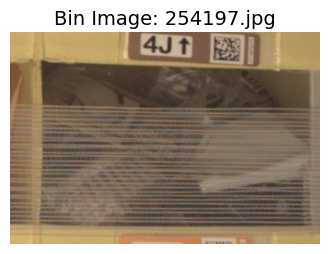


=== RAW RESULT (pprint) ===
[{'asin': 'B00004OCL3',
  'name': 'OXO Good Grips Household Scrub Brush',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.9617435932159424,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B0060JNZHK',
  'name': 'Teas Etc Very Vanilla Loose Leaf Rooibos 8 oz.',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.131636619567871,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01C70KZNW',
  'name': 'Baloray MINI Cute white Panda design Desktop Hand Stapler for '
          'Office Home travel school(6cm*2.5CM)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.621603012084961,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/132062.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/132062.json


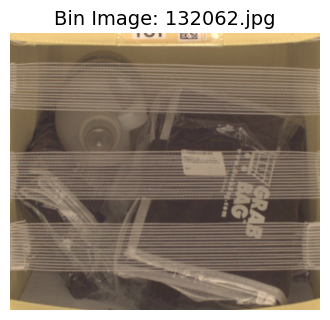


=== RAW RESULT (pprint) ===
[{'asin': 'B00CRATTT4',
  'name': "Mrs. Meyer's Clean Day 2x HE Liquid Laundry Detergent, Basil, 64 "
          'Ounce Bottle',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.820993661880493,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00U0EXEUE',
  'name': '1 X ASOTV Insulated Reusable Grab Bag Grocery Shopping Tote Holds '
          'Up To 40 lbs',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.720816135406494,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/388922.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/388922.json


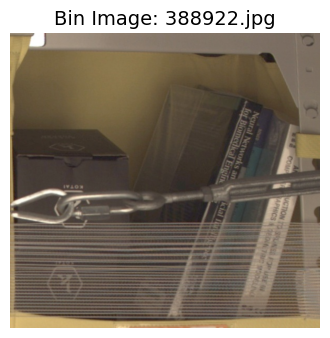


=== RAW RESULT (pprint) ===
[{'asin': '0387954880',
  'name': 'Geometric Level Set Methods in Imaging, Vision, and Graphics',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1457695960998535,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0780334043',
  'name': 'Neural Networks and Artificial Intelligence for Biomedical '
          'Engineering (IEEE Press Series on Biomedical Engineering)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.03969669342041,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0803603045',
  'name': 'Case Studies in Neuroscience',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.044780731201172,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0865779570',
  'name': 'Neurosurgery Board Review: Questions and Answers for '
          'Self-Assessment',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.206681728363037,
  'patch_hits': 36,
  'pass': T

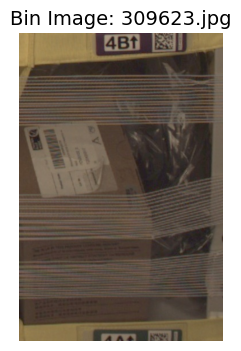


=== RAW RESULT (pprint) ===
[{'asin': 'B005P5Q9PK',
  'name': 'Wool Flexfit 504',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.100398302078247,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00C74OM1K',
  'name': 'Mitsubishi WD-60735 DLP Assembly with High Quality Osram Neolux '
          'Bulb Inside',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9875948429107666,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/357196.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/357196.json


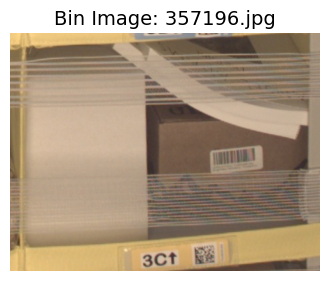


=== RAW RESULT (pprint) ===
[{'asin': '0821221876',
  'name': 'The Print (Ansel Adams Photography, Book 3)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.9609932899475098,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00CRKJ2AU',
  'name': 'Fitbit One Charging Cable',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.944490432739258,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00JIXYYGQ',
  'name': 'Nutribullet Tall Blending Cup with Screw off Comfort Lip Ring, 24 '
          'OZ',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.0947985649108887,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00K30HT38',
  'name': 'Eagles Nest Outfitters - SingleNest Hammock, Purple/Fuchsia (FFP)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9312808513641357,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_

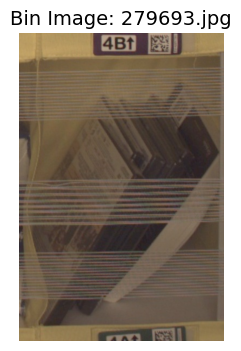


=== RAW RESULT (pprint) ===
[{'asin': '083083415X',
  'name': 'Evil and the Justice of God',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8889098167419434,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0014QLEI6',
  'name': 'First Sunday',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.8045663833618164,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B001OXLGJG',
  'name': 'The Spectacular Spider-Man: Volume Three',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.9119725227355957,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/111525.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/111525.json


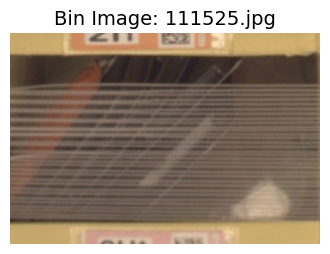


=== RAW RESULT (pprint) ===
[{'asin': 'B00DC2FE3Q',
  'name': 'Earth Friendly Products Hand Soap Refill, Lemongrass, 32 Ounce',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8565826416015625,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00KW3MTBS',
  'name': 'Kingston Digital HyperX FURY 120GB SSD SATA 3 2.5 Solid State Drive '
          'with Adapter (SHFS37A/120G)',
  'required_qty': 7,
  'predicted_qty': 1,
  'max_similarity': 2.6586861610412598,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01H70G3PQ',
  'name': 'Lightning Cable, KOOWIEN 2Pack 3ft 8pin Lightning to USB Charging '
          'Cord for iPhone 5/5s/5c/6/6s Plus/SE, iPad mini/Air/Pro, iPod touch '
          '- Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.5857748985290527,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1

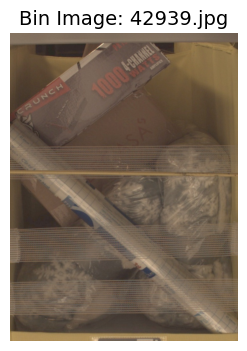


=== RAW RESULT (pprint) ===
[{'asin': 'B00D8GBO2G',
  'name': 'Con-Tact Brand Clear Covering Self-Adhesive Privacy Film and Liner, '
          '18-Inches by 9-Feet, Clear Matte',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.4855098724365234,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00N1XD4VA',
  'name': 'Northpoint Ardour Printed Velvet Berber Sherpa Reversible Throw, '
          'Snowflakes',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.985198736190796,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B0196FLS50',
  'name': 'crunch PX1000.4 Power Amplifier (Class Ab, 4 Channels, 1,000 Watts)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.512220621109009,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01CU1FB2S',
  'name': 'SOLECASA 8" Cartoon Porcelain Dinnerware Set for Kids/Children Cute '
          'Round Ceramic Steak/Dessert Dinner Plates with Fox, Rabbit, '


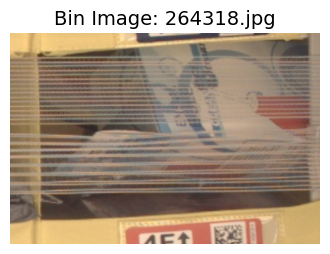


=== RAW RESULT (pprint) ===
[{'asin': 'B000002ZWA',
  'name': 'Songs by Gounod',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0707499980926514,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B002SKG8GU',
  'name': 'Cleanstream Enema Bulb, Red',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8259167671203613,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B009MMVGY6',
  'name': 'Jelly Belly Black Jelly Beans, Licorice, 1 Pound',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7644577026367188,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00QV6SYDW',
  'name': 'Finger Puppets Finger toys,Danibos 12pcs Velvet Small animal in '
          'garden Baby Stories Helper, Finger Puppets Finger Toys Set '
          ',Christmas Gift for kids(finger toy) (finger toy(12pcs animal))',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.5361521244049072,
  'patch_hits': 36,
  '

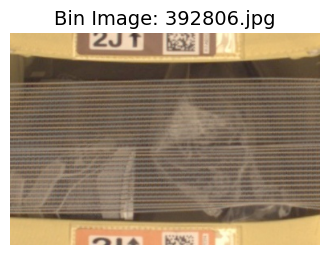


=== RAW RESULT (pprint) ===
[{'asin': 'B00F3JZNBY',
  'name': 'Scotch Magic Tape Dispenser, Seattle Seahawks Football Helmet with '
          '1 Roll of 3/4 x 350 Inches Tape',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.7483625411987305,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00S4GT29W',
  'name': 'Reebow Gear® Tactical Molle Pouch EDC Utility Gadget Belt Waist Bag '
          'with Cell Phone Holder for iPhone 6Plus Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.383120059967041,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/254415.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/254415.json


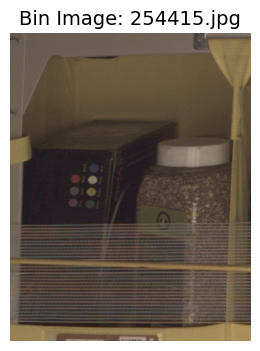


=== RAW RESULT (pprint) ===
[{'asin': 'B00GEAB572',
  'name': 'WoneNice Universal Flexible Long Arms Mobile Phone Holder Desktop '
          'Bed Lazy Bracket Mobile Stand Support all Mobiles Wide Less Than '
          '90mm for Bedroom, Kitchen, Office, Bathroom etc... (White)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.882577419281006,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B013H4HR3S',
  'name': 'Huma.ne Non-Toxic Pest Repellent Pellets Repels Rabbits, Rats, '
          'Snakes, Mice, Flea & Ticks, Spiders, Fire Ants & More Safe for '
          'Children, Pets & Plants, 1.25 lb',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9230382442474365,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0156LTOPE',
  'name': 'Powerextra 2200mAh Eureka 96 Series Replacement Battery for Eureka '
          '60776/68112/39150 Eureka 96 Series Vacuum',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2

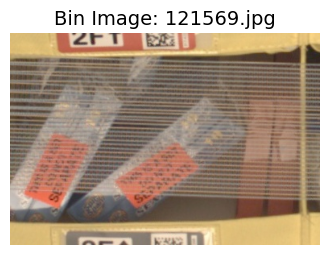


=== RAW RESULT (pprint) ===
[{'asin': 'B014QN2BJ4',
  'name': 'iPhone 6 Case, Dimaka Floral Pattern Flower Wallet Case, with Flip '
          'Stand Card Slots Cash Compartment, Premium PU Leather with Strap '
          'Hole for iPhone 6 / iPhone 6S - Bush Flower',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.7913529872894287,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01C966P10',
  'name': 'Flushable Sanitary Seat Wipes 2 Box Value',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.930393934249878,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/181777.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/181777.json


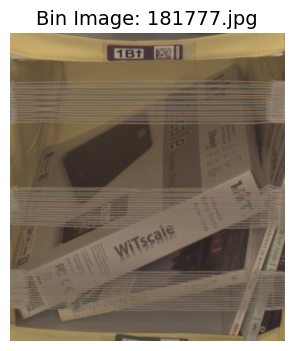


=== RAW RESULT (pprint) ===
[{'asin': '048624301X',
  'name': 'American Country Houses of the Gilded Age: (Sheldon\'s "Artistic '
          'Country-Seats") (Dover Architecture)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9802329540252686,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0764124862',
  'name': 'Painting Houses & Gardens in Watercolor',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.067692518234253,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0785276815',
  'name': 'The Management Methods Of Jesus Ancient Wisdom For Modern Business',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.078956127166748,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '1568985002',
  'name': 'Proceed and Be Bold: Rural Studio After Samuel Mockbee',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.818222761154175,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 

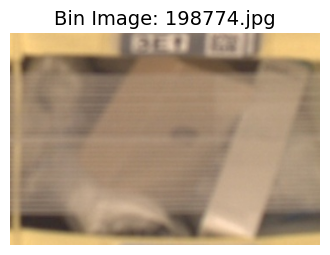


=== RAW RESULT (pprint) ===
[{'asin': 'B006K8YQYW',
  'name': 'NEW Key Shell For Ford Keyless Entry Remote Key 3 Buttons No Chips '
          'Inside FCC...',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.7489442825317383,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00UOT6ZOM',
  'name': 'HiveNets Smart Fitness Activity Tracker Wristband for iPhone 6s/6 '
          'Plus/5/5s/5c with IOS 8.0 and Above Samsung and Others Smart Phone '
          'with Android',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7281930446624756,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00YY6TZFC',
  'name': 'Go Spoon Pot Clip | 2pcs of Outstanding Universal Hygienic Ladle '
          'Clip Pot Pan Spoon Holder Rest | Kitchen Stove Handy Cooking '
          'Utensils Organizer | Premium Grade, Anti Slip, Heat Resistant '
          'Silicone Material | Color May Vary| 773',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_si

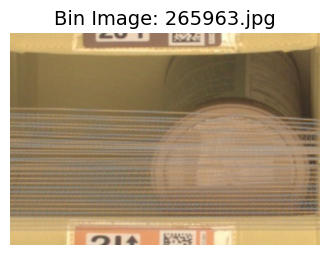


=== RAW RESULT (pprint) ===
[{'asin': 'B005KG7EDU',
  'name': 'Great Lakes Gelatin Collagen Hydrolysate Beef, Kosher, 16 oz.',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8395721912384033,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/294425.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/294425.json


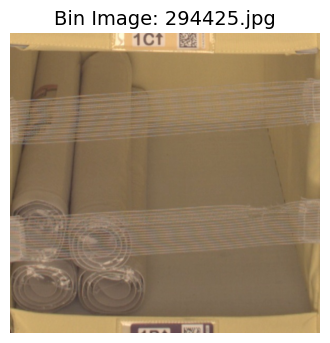


=== RAW RESULT (pprint) ===
[{'asin': 'B004MDM8ZQ',
  'name': 'Rubbermaid Commercial FG704104WHT Rubber Safti-Grip Bath Mat, '
          'Large, White',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 3.2224981784820557,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/223903.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/223903.json


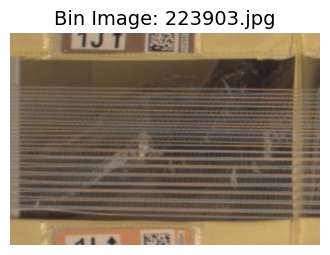


=== RAW RESULT (pprint) ===
[{'asin': 'B00Q59EQ3C',
  'name': 'Lacdo EVA Shockproof Carrying Travel Case for 2.5-Inch Portable '
          'External Hard Drive, GPS Camera and External Battery Pack',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.5888350009918213,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/277723.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/277723.json


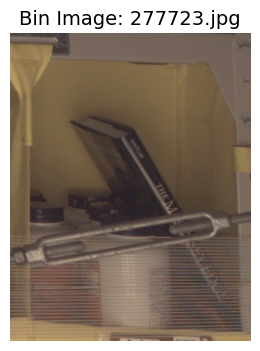


=== RAW RESULT (pprint) ===
[{'asin': '1259588688',
  'name': "The McKinsey Edge: Success Principles from the World's Most "
          'Powerful Consulting Firm',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.994755744934082,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0013OVX58',
  'name': 'NOW Foods L-Arginine 500mg, 250 Capsules',
  'required_qty': 5,
  'predicted_qty': 1,
  'max_similarity': 2.860443592071533,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/200096.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/200096.json


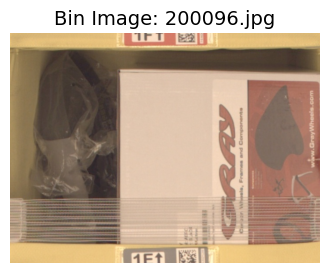


=== RAW RESULT (pprint) ===
[{'asin': 'B002HWRZ3E',
  'name': 'T-fal D91305 Signature Hard Anodized Scratch Resistant PFOA Free '
          'Nonstick Thermo-Spot Heat Indicator Fry Pan Cookware, 10-Inch, '
          'Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6220178604125977,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00G4ED2LK',
  'name': 'GRAY Triathlon/Time Trial TT Aero Helmet - Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.942462205886841,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/110753.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/110753.json


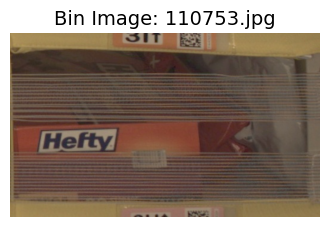


=== RAW RESULT (pprint) ===
[{'asin': 'B00CFIX7NC',
  'name': 'GNC Pro Performance BCAA Complex Chew Tropical Punch 60 Chews',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0626718997955322,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00KR4CZIY',
  'name': 'Hefty Slider Storage Bags, Gallon, 80 Count',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8254289627075195,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01EYDPIXC',
  'name': 'Kirei Sui 4th Of July Princess Blue Stars PETS Tutu Dress Medium '
          'White',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.016608476638794,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/233872.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/233872.json


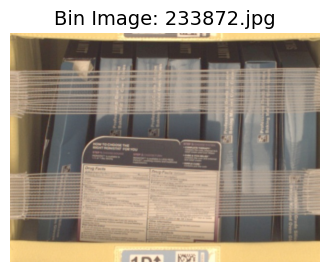


=== RAW RESULT (pprint) ===
[{'asin': 'B000GCIAHM',
  'name': 'Monistat 7 Vaginal Antifungal Cream with Disposable Applicators, '
          '1.59-Ounce Tube',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.3301069736480713,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0186KEL3W',
  'name': 'Cuisineye BBQ Gloves Oven Mitts Food Grade Silicone with Quilted '
          'Liner for Camping Grilling Baking',
  'required_qty': 7,
  'predicted_qty': 1,
  'max_similarity': 2.661942720413208,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/128813.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/128813.json


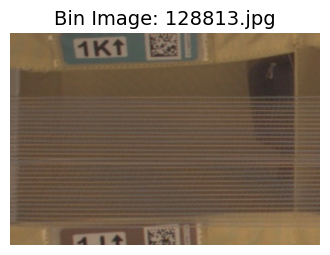


=== RAW RESULT (pprint) ===
[{'asin': 'B00I7F4DYO',
  'name': 'Charging Dock for most Android phones and Tablets,galaxy Tab '
          '3,SIII,SIV,HTC,SONY,LG,US seller',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.61568546295166,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/265998.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/265998.json


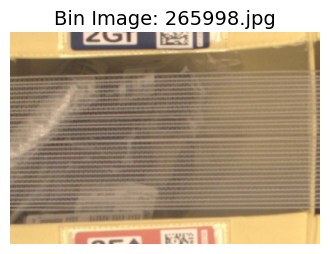


=== RAW RESULT (pprint) ===
[{'asin': 'B00004UDHN',
  'name': 'Dremel 454 3/16" Grinding Stone, 2 Pack',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.89518666267395,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B007WSH3JY',
  'name': 'Secrid mini wallet leather amazon black, Very Slim Credit Card '
          'Wallet / with RFID protection, with one click all cards slide out '
          'gradually',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9596495628356934,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00CF3F9LK',
  'name': 'Veezee - Dba Von Zipper Libertine Rectangular Sunglasses, Gold, 54 '
          'mm',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.970093250274658,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/319028.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata

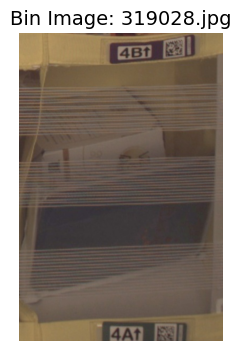


=== RAW RESULT (pprint) ===
[{'asin': 'B01A00BPKS',
  'name': 'iPad Mini Case, iPad mini 2/3 Case - TheONE Stand Case with Auto '
          'Sleep/Wake Function for Apple iPad Mini, iPad Mini 2 & 3-\xa0Dark '
          'Green',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.715672492980957,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01D3H7OEG',
  'name': 'Via Bom Dia Certified Organic Dirty Chai Single-Serve Keurig '
          'Machines, 18 Pack',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.974432945251465,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/215552.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/215552.json


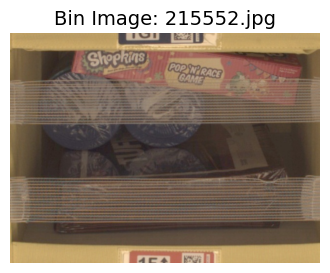


=== RAW RESULT (pprint) ===
[{'asin': 'B000GR5X68',
  'name': 'Smead TUFF® Expanding File, Monthly (Jan.-Dec.), 12 Pockets, Flap '
          'and Elastic Cord Closure, Letter Size, Redrope-Printed Stock '
          '(70388)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.2746453285217285,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00HT7UVEM',
  'name': 'Universal Replacement Filter Cartridges Type A or C  (Pack of 2)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.109408378601074,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00RZUDKKU',
  'name': "Shopkins Pop 'N' Race Game -- Classic Game with Shopkins Theme",
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.121324062347412,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/353177.jpg
📄 JSON :  /kaggle/input/amazon/sub_metada

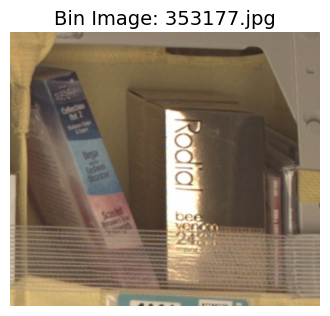


=== RAW RESULT (pprint) ===
[{'asin': '1484782968',
  'name': 'Star Darlings Collection: Volume 2: Vega and the Fashion Disaster; '
          'Scarlet Discovers True Strength; Cassie Comes Through',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.136906385421753,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00006I0AT',
  'name': 'Play Bluegrass Instrumentals',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.084831953048706,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B000H0MMRM',
  'name': 'Heard It In A Love Song',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.105823516845703,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00FA4BK3C',
  'name': 'Rodial Bee Venom 24 Carat Gold Super Essence Serum, 1.01 fl. oz.',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.2320568561553955,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00MK1RJII',
 

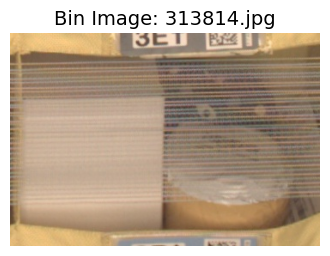


=== RAW RESULT (pprint) ===
[{'asin': 'B000JCXJO8',
  'name': 'Petsafe Squeeze Meeze(TM) Jr. Latex Dog Toy, Octopus',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.855018138885498,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00BM8VX0K',
  'name': 'Funny Guy Mugs Joe. Ceramic Coffee Mug, Black, 11-Ounce',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6662392616271973,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00M4TCD2I',
  'name': 'CoverGirl Professional Natural Lash Mascara-Clear (100)-0.34 oz',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.258862018585205,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00ZFJ5CGI',
  'name': 'HIFROM(TM) New OIL FILTERS for Kawasaki 49065-7007 49065-7002 '
          '49065-2057',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9767863750457764,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS

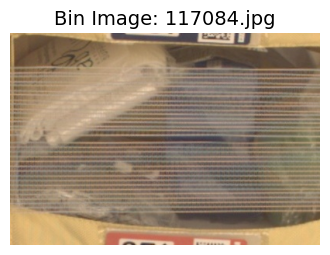


=== RAW RESULT (pprint) ===
[{'asin': 'B00GLSXUDY',
  'name': 'Bags on Board Easy Tie Waste Pick up Bags',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0077972412109375,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00T1FHRMY',
  'name': '1/8" Depth --- Offset Mounting Canvas Z Clips For Picture Framing '
          '-- #6 X 3/8" Pan-Head Screws Included -- Pack of ONE HUNDRED (100)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1821014881134033,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00XJP8BHM',
  'name': 'Groovy Owl Collapsible BPA Free Silicone Sports Water Bottles Green',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.765799045562744,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0186A1MCU',
  'name': 'Cotton Compression Socks - Graduated Compression Firm Support '
          '20-30mmHg - Closed Toe, Unisex - White Medium Absolute Support',
  'required_qty': 1

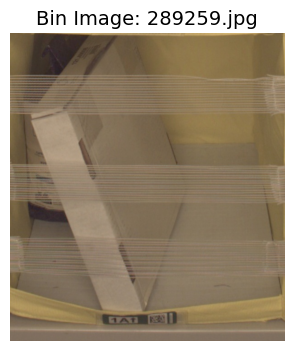


=== RAW RESULT (pprint) ===
[{'asin': 'B0002HBMZI',
  'name': 'Old Mother Hubbard Classic Original Assortment Mini Natural Crunchy '
          'Dog Treat Biscuits, 3.8-Pound Bag',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.3180577754974365,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B000IY9IMY',
  'name': 'Centric Parts 121.49008 C-Tek Standard Brake Rotor',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2719171047210693,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/02501.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/02501.json


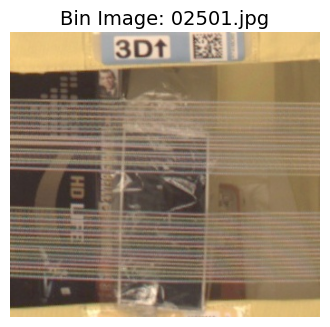


=== RAW RESULT (pprint) ===
[{'asin': 'B000WPJSXI',
  'name': 'WWII - World at War Double Feature: The Memphis Belle: A Story of a '
          'Flying Fortress (1944) / Thunderbolt (1947)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.994480609893799,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00KXDS4VQ',
  'name': 'enKo products Mini HDMI To AV RCA Composite & S-video Video R/L '
          'Audio Converter With High Speed HDMI Cable (6.5 Feet / 2 Meter) , '
          'RCA Cable And S-Video Cable Included - Not for Windows 10',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9757585525512695,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00XZXK518',
  'name': 'Inask Heavy Duty Hard Back Cover Case with Tpu Soft Bumper Red '
          'Vending Machine for Iphone 6 4.7" 4.7inch & Lcd Screen Film',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.746121644973755,
  'patch_hits': 36,
  'pass': 

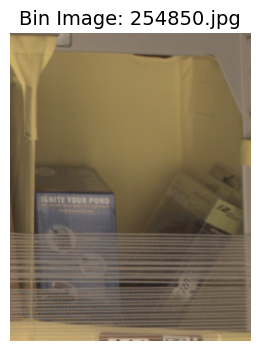


=== RAW RESULT (pprint) ===
[{'asin': 'B0059DTNA6',
  'name': 'Enermax PWM Series T.B. Silence 120mm Ultra Quiet Twister Bearing '
          'Cooling Case Fan, Black UCTB12P',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.006357431411743,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00LN8CV4G',
  'name': 'Anjon Manufacturing ABPL1 Brass LED Puck Light - 1 Watt',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9879653453826904,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01GCV2H7Y',
  'name': 'iPhone 6 Plus/6S Plus Case, Feceir® [Heavy Duty] [Shock-Absorption] '
          '[Kickstand Feature] Hybrid Dual Layer Armor Defender Full Body '
          'Protective Case Cover (Armor-Silver)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.6098365783691406,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-

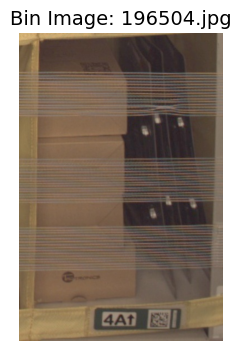


=== RAW RESULT (pprint) ===
[{'asin': 'B000BB40Z4',
  'name': 'Pacer Performance 25-535 Black Bumper Protector Pad Kit - 2 Piece',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.899989128112793,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B015W17OSW',
  'name': 'TaoTronics 51 Led UV Black Light with UV Glasses and Duracell '
          'Battery',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.7788524627685547,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/170090.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/170090.json


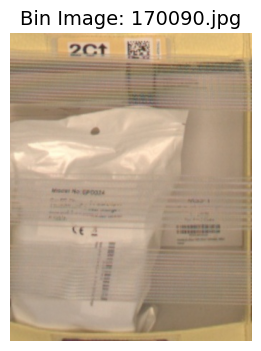


=== RAW RESULT (pprint) ===
[{'asin': 'B001804CLY',
  'name': 'Hario MSS-1TB Mini Coffee Mill Slim Grinder',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8396785259246826,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01HNIC6TY',
  'name': 'Galaxy S6 Edge Plus Waterproof Case, Punkcase StudStar Pink Samsung '
          'Galaxy S6 Edge Plus Thin Fit 6.6ft Underwater IP68 Shockproof '
          'Dirtproof Snowproof Case',
  'required_qty': 8,
  'predicted_qty': 1,
  'max_similarity': 2.94276762008667,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01HOR88JG',
  'name': 'Monkey Man 3-Socket Cigarette Lighter Power Adapter DC Outlet '
          'Splitter with 2-Port USB Car Charger',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.5683469772338867,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/3124

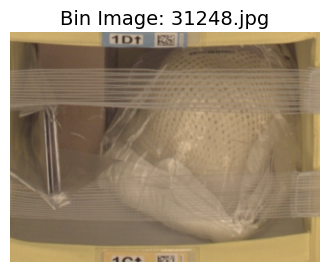


=== RAW RESULT (pprint) ===
[{'asin': 'B004V9YYV2',
  'name': 'MLB Detroit Tigers 4.5-by-17 Sign',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 3.1828646659851074,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00A767LE0',
  'name': 'Creative Converting Paper Tray, 11-Inch, Patriotic Stars',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 3.0230517387390137,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B012C6E88O',
  'name': 'Amarine-made Aluminium Alloy Adjustable Clamp on Fishing Rod Holder '
          'Rods Rack',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.91261625289917,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01DB1W322',
  'name': '6 Pack Cutie Collections Girls Tea Party Flower Costume Sun Hats '
          '(White)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.719902992248535,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERA

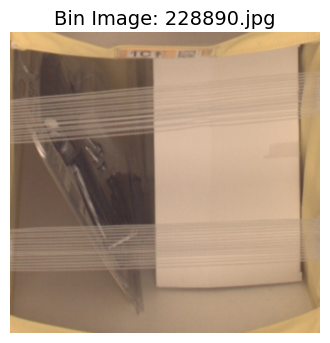


=== RAW RESULT (pprint) ===
[{'asin': 'B0000223U7',
  'name': 'Stanley GR100 Glue-Pro DualMelt Glue Gun',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1444344520568848,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B019IAY83M',
  'name': 'EasyPAG 3 Tier Desk Letter Tray Carved Hollow Flower Pattern Design '
          'Triple Letter Tray ,Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6288890838623047,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/36607.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/36607.json


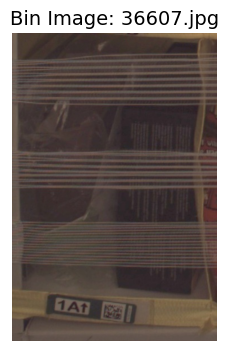


=== RAW RESULT (pprint) ===
[{'asin': 'B002KRR3NS',
  'name': 'Space Saver 2-Up 72 Pocket Photo Album',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0256118774414062,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00BNIO4H8',
  'name': 'JBL Charge Portable Wireless Stereo Speaker and Charger with '
          'Bluetooth (Gray)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.947019577026367,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00I3J1TMI',
  'name': 'Progressive International Microwavable Potato Cooker with Lid '
          '(BROWN)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.899569272994995,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/124366.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/124366.json


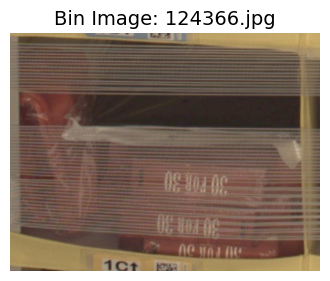


=== RAW RESULT (pprint) ===
[{'asin': 'B00HXPIQFG',
  'name': 'MoKo Microsoft Surface 3 Case - Ultra Slim Lightweight Smart-shell '
          'Cover Case for Surface 3 10.8 inch 2015 Version Windows 8.1 Tablet, '
          'BLACK',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.3569393157958984,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00N9XKS2U',
  'name': 'ESPN Films 30 for 30: Five-Year Anniversary Collection BD [Blu-ray]',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.888460874557495,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01CGMTD9I',
  'name': 'Silicone Muffin Pan,12 Cups Red Cupcake Baking Tray by Suntake - '
          '100% Premium Silicone & BPA free',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7789254188537598,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_ima

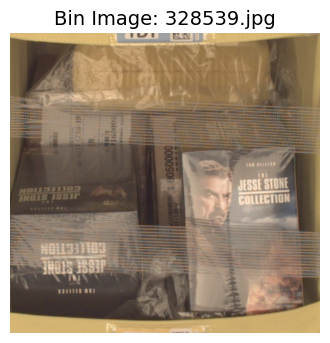


=== RAW RESULT (pprint) ===
[{'asin': 'B0006LA5R6',
  'name': 'APC Symmetra LX power distribution panel - power backplate ( SYPD11 '
          ')',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1960911750793457,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B000KL1HVK',
  'name': 'Pennzoil 550022757 Premium Plus Outboard 2-Cycle Marine Engine Oil '
          '- 1 Gallon',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.008729934692383,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00451W378',
  'name': 'Coffee-mate Coffee Creamer, Irish Creme Liquid Singles, .375-Ounce '
          'Creamers (Pack of 180)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.959289073944092,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00LHR5A32',
  'name': 'Whirlpool W10205415  Drive Belt - Dryer',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1141772270202637,
  'patch_hits'

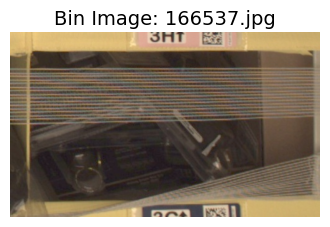


=== RAW RESULT (pprint) ===
[{'asin': 'B005CMZYQQ',
  'name': 'SABRE Pepper Spray - Advanced 3-In-1 Police Strength - Compact, '
          'Black Case & Quick Release Key Ring (Max Protection - 25 shots, up '
          "to 5x's more)",
  'required_qty': 8,
  'predicted_qty': 1,
  'max_similarity': 2.725348949432373,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01DIMGC6M',
  'name': 'Fantaseal\xa0Hi-Reflective\xa0Safety\xa0Vest\xa0for\xa0GoPro\xa0'
          'Chest\xa0Mount\xa0Harness Chest\xa0Strap\xa0Moun\xa0for\xa0GoPro\xa0'
          'Hero\xa04\xa0/3+\xa0/3/Session\xa0+\xa0SJCAM\xa0SJ6000/5000/4000\xa0'
          'for\xa0Running\xa0Jogging\xa0Cycling\xa0Exploring (\xa0'
          'Fluorescent\xa0Green)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.759422779083252,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/32113.jpg
📄 JSO

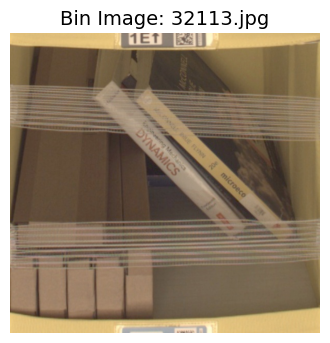


=== RAW RESULT (pprint) ===
[{'asin': '0073523917',
  'name': 'The Art of Public Speaking',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1137704849243164,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0077660811',
  'name': 'Microeconomics: Principles, Problems, & Policies (McGraw-Hill '
          'Series in Economics)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.176877498626709,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0133915387',
  'name': 'Engineering Mechanics: Dynamics (14th Edition)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.077346086502075,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '188775234X',
  'name': 'The Sublime Treasures',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9191014766693115,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B008M5U1C2',
  'name': "Victorinox Fibrox Straight Edge Chef's Knife, 8-In

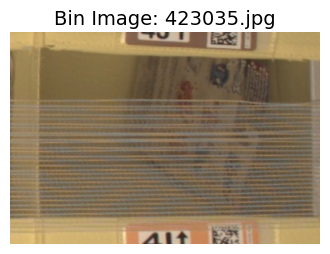


=== RAW RESULT (pprint) ===
[{'asin': 'B01B7P0MRM',
  'name': 'Finding Dory Swigglefish Bailey Figure',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.092857837677002,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/401383.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/401383.json


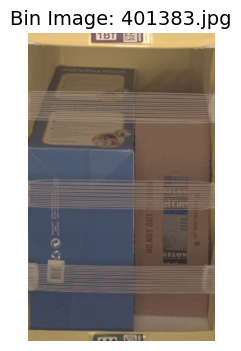


=== RAW RESULT (pprint) ===
[{'asin': 'B000GG1O6M',
  'name': 'Bigelow Earl Grey Tea, 40-Count Boxes (Pack of 6)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2679882049560547,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00A4YA14C',
  'name': 'KidsKit Bath Toy Organizer | Bath Toy Holder Featuring A Pelican '
          'With A Bath Toy Storage Net For Bath Toys',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.6373016834259033,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00CWTY9I6',
  'name': 'Torani Syrup, Blackberry, 25.4 Ounce (Pack of 4)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.184007167816162,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/179824.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/179824.json


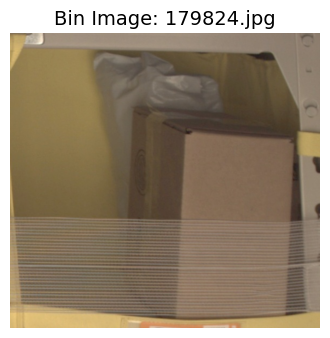

🔥 ERROR: Input Retail product in an Amazon fulfillment center bin, possibly wrapped or occluded: Fujifilm Instax Mini 8 Instant Camera Accessory Bundles Set (Fujifilm instax mini 8 case bag/ Instax Mini Book Album/ Mini 8 close-up lens(self-portrait mirror)/ Colorful Filter For Mini 8 Instant Camera/ Camera Strap for Mini 8 Instant Camera/ 3 Inch Photo Frame/ Colorful decor sticker borders/ Colorful wall decor hanging frame) Set8 (Blue) is too long for context length 77


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/111462.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/111462.json


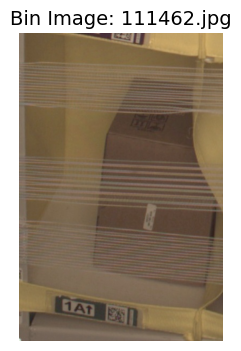


=== RAW RESULT (pprint) ===
[{'asin': 'B0012PRZYG',
  'name': 'Replacement Lamp for The IN2102, IN2104, IN2106, IN2102EP, '
          'IN2104EP, A1100, A120',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.4736928939819336,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/165573.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/165573.json


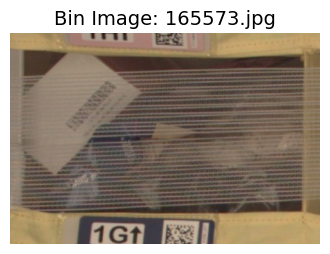


=== RAW RESULT (pprint) ===
[{'asin': 'B0002YRJ6M',
  'name': 'Mountain House Ice Cream Sandwich 1.13 oz',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.967109203338623,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B000A0IL1A',
  'name': "Mrs. Meyer's Clean Day Surface Scrub, Lavender, 11 Ounce Bottle",
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.0013785362243652,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00AHZGOVC',
  'name': 'Lorell LLR49323 Replacement Chair Tips with Felt',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9506161212921143,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00XM1HOBC',
  'name': 'Sea Shells Mixed Beach Seashells - Various Sizes up to 2" Shells '
          '-Bag of Approx. 50 Seashells',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7554962635040283,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0

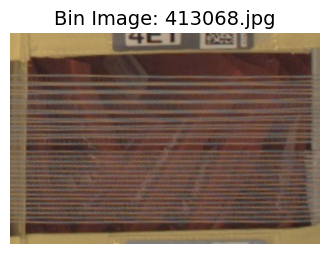


=== RAW RESULT (pprint) ===
[{'asin': 'B00LD2TIUM',
  'name': 'iPerb® Aluminum Alloy Tri-cone Shaped Tent Stakes Pegs 15g '
          'Each-Pack of 14',
  'required_qty': 14,
  'predicted_qty': 1,
  'max_similarity': 2.6740639209747314,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/251258.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/251258.json


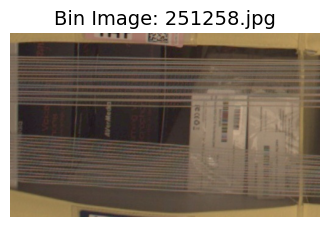


=== RAW RESULT (pprint) ===
[{'asin': 'B00XUP5M6Y',
  'name': 'GoPro Camera HERO+ LCD HD Video Recording Camera',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.9697279930114746,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B015OZ9C68',
  'name': 'AVerMedia USB 2.0 Stand Alone Voice Chat Microphone, Laptop / '
          'Desktop PC, PC Game, Voice Chat, Video Call, Skype, MSN, '
          'Conferencing (GM310)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.871084690093994,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/332916.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/332916.json


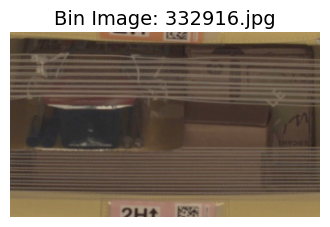


=== RAW RESULT (pprint) ===
[{'asin': 'B007I3ZNDG',
  'name': 'Rewined Cabernet Scented Soy Wax Wine Bottle Candle',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.147010087966919,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00KLWBTVG',
  'name': 'Meetlocks MEETLOCKS 20CrMnTi Folding Bike Lock, Ultra Strong Steel '
          'Alloy Metal Bone With Plastic Coating, 80 Cm Length',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.4144554138183594,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00VS1UDIY',
  'name': 'Giant Bubble Wonki Wand Outdoor Picnic Party Fun Toy - As Seen On '
          'TV',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.879237651824951,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01AHSIMT0',
  'name': 'The Leftover Materials Classic Car 03 Small Natural',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9055495262145996,
  'patch_hits

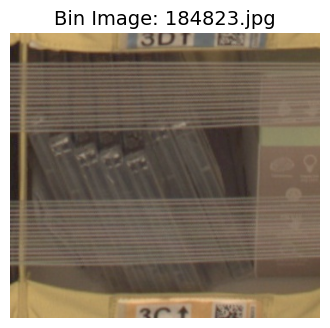


=== RAW RESULT (pprint) ===
[{'asin': 'B003O680RM',
  'name': 'The Sly Collection - Playstation 3',
  'required_qty': 7,
  'predicted_qty': 1,
  'max_similarity': 2.923793077468872,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B0097BEG1C',
  'name': 'Apple MD827LL/A EarPods with Remote and Mic - Standard Packaging - '
          'White',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.913395404815674,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00K4K3SSM',
  'name': 'Bloomby Unlock, Turn and Learn Shape Sorter Wooden Educational Toys '
          '(Learning, Developmental Toy for Baby, Toddlers, Preschoolers)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9319357872009277,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00MU3JXE4',
  'name': 'Rifle Bullet Pen',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.110751152038574,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits':

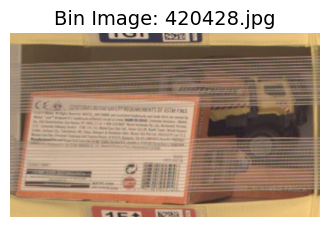


=== RAW RESULT (pprint) ===
[{'asin': 'B00IM4J1BA',
  'name': 'Matchbox Rev Rigs Flatbed Truck',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 3.034691333770752,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/306508.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/306508.json


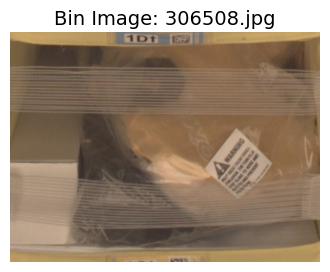


=== RAW RESULT (pprint) ===
[{'asin': 'B005ASTWRY',
  'name': 'AEM 25-201BK High Volume Fuel Filter',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0883357524871826,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B006R6YEA8',
  'name': "O'Neill USCG nylon infant life vest (up to 30 lbs) "
          'Yellow/pacific/coal',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.011446714401245,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/309972.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/309972.json


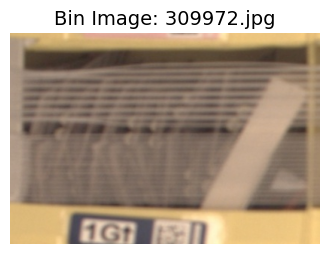


=== RAW RESULT (pprint) ===
[{'asin': '1848549563',
  'name': 'What If?: Serious Scientific Answers to Absurd Hypothetical '
          'Questions',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8614866733551025,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0047CP6SI',
  'name': 'Pentel Twist-Erase III Automatic Pencil with 2 Eraser Refills, '
          '0.9mm, Assorted Barrels, 2 Pack (QE519BP2-K6)',
  'required_qty': 21,
  'predicted_qty': 1,
  'max_similarity': 3.163341522216797,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00LMILRDS',
  'name': 'E-Flite LiPo Battery 3000mAh 3S 11.1V 30C EC3 EFLB30003S30',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.772289276123047,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/25559.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-0

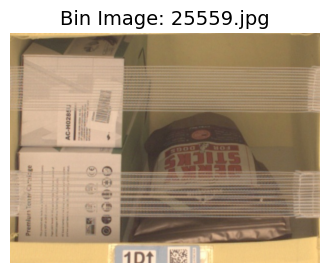


=== RAW RESULT (pprint) ===
[{'asin': 'B00KFLEFE6',
  'name': 'Rocco & Roxie Gourmet Jerky Dog Treats - Slow Smoked, Delicious, '
          'Tender AND Healthy 7" Jerky Sticks - Chicken - 16 oz. Bag',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.5080294609069824,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00QWB35N0',
  'name': 'Sherman Toner Cartridges ® CE285A (85A) Compatible Black Laser '
          'Toner Cartridge for HP Laserjet Pro P1102W, M1130, M1210,',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.9845194816589355,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/286891.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/286891.json


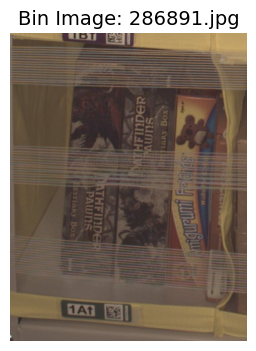


=== RAW RESULT (pprint) ===
[{'asin': '0470603488',
  'name': 'The Sciences: An Integrated Approach',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2122316360473633,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '1601255616',
  'name': 'Pathfinder Pawns: Bestiary Box',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.1961207389831543,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B003W1216U',
  'name': 'Lion Brand Yarn AFS-AM4 Amigurumi Friends Kit, Walle The Koala',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8482110500335693,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/41323.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/41323.json


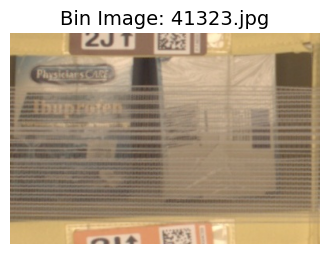


=== RAW RESULT (pprint) ===
[{'asin': 'B00DOA4AAO',
  'name': 'PhysiciansCare Ibuprofen Pain Reliever Medication (Compare to '
          'Advil), 200mg, 50 Packets of Two Tablets',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.06541109085083,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/14108.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/14108.json


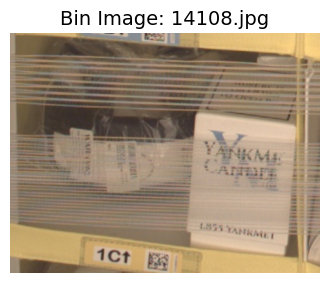


=== RAW RESULT (pprint) ===
[{'asin': 'B00099YJ6S',
  'name': 'Tachikara Institutional quality Composite VolleyBall, Black-White',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.045809507369995,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B001UA6CJW',
  'name': 'General Tools 167 Professional Tap Wrench Set',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1146185398101807,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00MW5D5LW',
  'name': "Yank Me Candle 'Urinal Mints' Scented Candles",
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.060133218765259,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/315288.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/315288.json


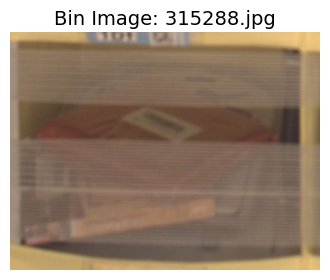


=== RAW RESULT (pprint) ===
[{'asin': '0373826109',
  'name': 'Taming a Dark Horse (Men of the West)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.814222812652588,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B000BR2ERO',
  'name': 'Stanley TR250 SharpShooter Plus Heavy-Duty Staple/Brad Nail Gun',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.0855212211608887,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B015Q6ZJ58',
  'name': 'Queenie® - 2 Pcs Solid Color Faux Silk Decorative Pillowcase '
          'Cushion Cover for Sofa Throw Pillow Case Available in 12 Colors & 7 '
          'Sizes (25.5 X 25.5 Inch (65 X 65 Cm, Orange)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.5696351528167725,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/33601.jpg
📄 JSON :  /kaggle/input/amaz

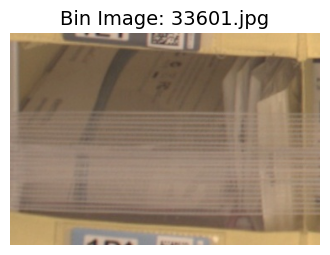


=== RAW RESULT (pprint) ===
[{'asin': 'B00DI764C0',
  'name': 'Embedded Pi',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9345479011535645,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00ELVVAG2',
  'name': 'Sea Change [Blu-ray Audio]',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.8601980209350586,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B0168AB2AC',
  'name': 'Topin® Punk Gothic Retro Black Lace Double Velvet Choker Necklace',
  'required_qty': 7,
  'predicted_qty': 1,
  'max_similarity': 2.825504779815674,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/180311.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/180311.json


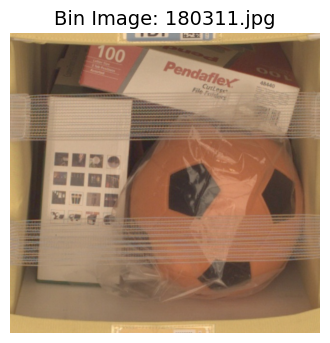


=== RAW RESULT (pprint) ===
[{'asin': 'B000VA205C',
  'name': 'Pendaflex CutLess File Folders, Letter Size, 1/3 Cut, Assorted '
          'Colors, 100 per Box (48440)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1931257247924805,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01A07QUXS',
  'name': 'Chastep Soft PU Sport Soccer football 8 inch Orange',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.8448352813720703,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01FFKZNLK',
  'name': '8Pack Copper Finish Solar Light Sogrand Solar Pathway Light Set',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.043428659439087,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/154306.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/154306.json


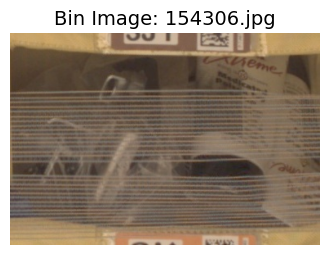


=== RAW RESULT (pprint) ===
[{'asin': 'B0000AX4I8',
  'name': 'Buyers Products L8815 T-Handle Latch (Latch,T-Handle,Sst,Sgl Pt '
          'W/Gskt & Ch545)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.9788639545440674,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B005SRUYN8',
  'name': 'Tecnu Extreme Medicated Poisno Ivy Scrub (4 oz) (Pack of 2)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9008092880249023,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/257605.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/257605.json


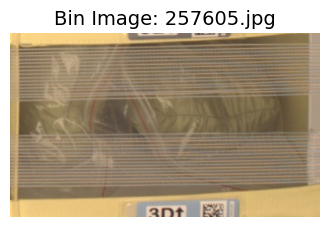


=== RAW RESULT (pprint) ===
[{'asin': 'B00XOOS02E',
  'name': 'Viking Nature Portable Lightweight Hammock with Hanging Straps, '
          'Parachute Nylon and Steel Components(Lime)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.086852788925171,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/309685.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/309685.json


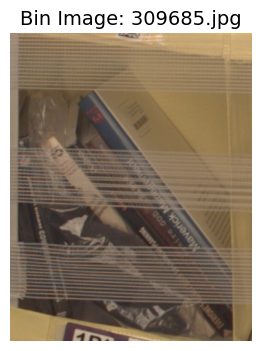


=== RAW RESULT (pprint) ===
[{'asin': '0793153778',
  'name': "Everyone's Money Book on Financial Planning",
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.063148021697998,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0870846035',
  'name': 'Responding to Crime (Criminal justice studies)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.289222478866577,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '0874138388',
  'name': 'Maverick Management:: Strategies for Success (Cultural Studies of '
          'Delaware and the Eastern Shore)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2214202880859375,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '1581346522',
  'name': "When I Don't Desire God: How to Fight For Joy",
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.114041328430176,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B003NF97JO',
  'nam

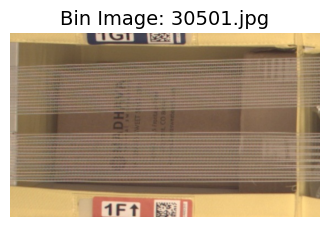


=== RAW RESULT (pprint) ===
[{'asin': 'B00B4IGS3U',
  'name': 'Ambrosia Pure Honey by Ambrosia Honey Co., 16 Ounce Bottles (Pack '
          'of 4)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0136592388153076,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00L1UKRPG',
  'name': 'Coleman Duo2 2V9WP-O 20 MP Waterproof Digital Camera with Dual LCD '
          'Screen (Orange)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.503432273864746,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/361127.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/361127.json


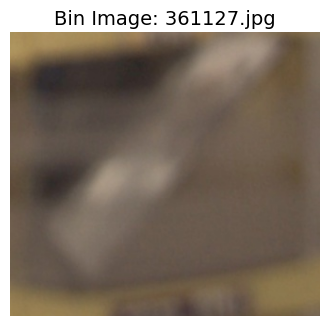


=== RAW RESULT (pprint) ===
[{'asin': 'B00F0N7Q0E',
  'name': 'Micro Monsters With David Attenborough 3d [Blu-ray]',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.6988768577575684,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B015QZMYFW',
  'name': 'WWE Basic Figure, Luke Harper',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.883326292037964,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/129335.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/129335.json


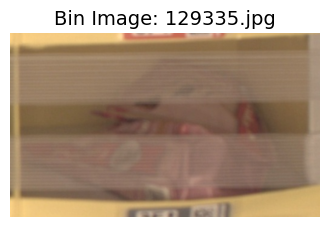


=== RAW RESULT (pprint) ===
[{'asin': 'B0062LJ26O',
  'name': 'EUKANUBA HEALTHY EXTRAS Adult Weight Control Dog Treats 12 Ounces',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.7925631999969482,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/166539.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/166539.json


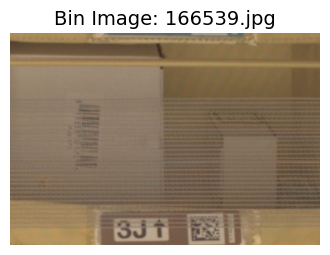


=== RAW RESULT (pprint) ===
[{'asin': 'B00IAVM0CC',
  'name': 'The Hillman Group The Hillman Group 4284 1/4-20 x 2 In. Stainless '
          'Steel Eye Bolts with Nut (8-Pack)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8239665031433105,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00J97SE2G',
  'name': 'LASPLASH Lip Divinity, Code Red',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.793065071105957,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00WH1RM2E',
  'name': 'Funny Guy Mugs I Heart My Husband Ceramic Coffee Mug, White, '
          '11-Ounce',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.475328207015991,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/263087.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/263087.json


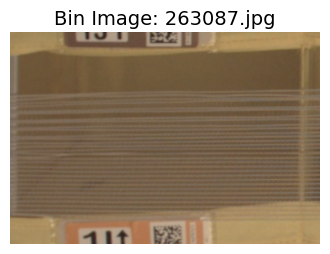


=== RAW RESULT (pprint) ===
[]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/134175.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/134175.json


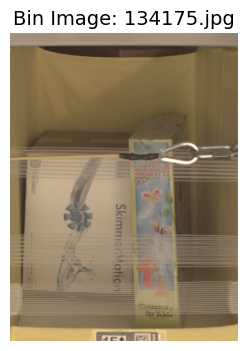


=== RAW RESULT (pprint) ===
[{'asin': 'B000RH2FK4',
  'name': 'Enchanted Fairy Garden Kit',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8189077377319336,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0087QDFBA',
  'name': 'SkimmerMotion - The Automatic Pool Cleaner, Skimmer & Clarifier - '
          'Suction Skimmer for Pools Up to 8 Ft deep',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.840839385986328,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/194088.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/194088.json


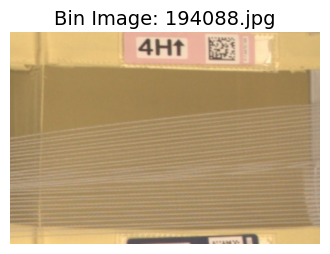


=== RAW RESULT (pprint) ===
[]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/368102.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/368102.json


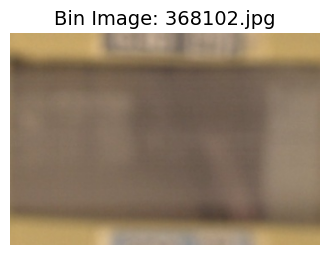


=== RAW RESULT (pprint) ===
[{'asin': 'B00004Z0NU',
  'name': 'Stanley Hardware 75-2380 Round End Zinc Screw Hooks',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.718146800994873,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0000CFURZ',
  'name': 'Magic Sliders 04225 Grip Tip Magic Sliders',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.646320343017578,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B002MGR8IM',
  'name': 'Oenobiol Aquadrainant Plus New Formula 45 Caplets 28 grams',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.6519346237182617,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00THQWK7O',
  'name': 'Canon VIXIA HFR600 Camcorder External Microphone Vidpro XM-L Wired '
          "Lavalier microphone - 20' Audio Cable - Transducer type: Electret "
          'Condenser',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6359686851501465,
  'pat

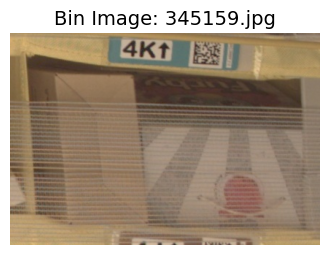


=== RAW RESULT (pprint) ===
[{'asin': 'B00AW6YBA2',
  'name': 'Furby Party Rockers Creature (Pink with Ears)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9889423847198486,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B018L9DUTO',
  'name': 'Habor 16 LED Outdoor Solar Powered Lights Motion Sensor Lamp for '
          'Outdoor Garden',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.754230499267578,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/230325.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/230325.json


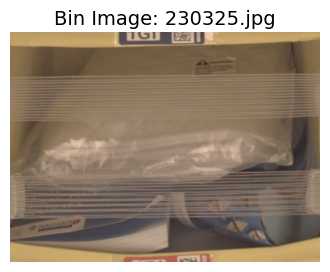


=== RAW RESULT (pprint) ===
[{'asin': '128405330X',
  'name': 'Evidence-Based Practice For Nurses: Appraisal and Application of '
          'Research (Schmidt, Evidence Based Practice for Nurses)',
  'required_qty': 6,
  'predicted_qty': 1,
  'max_similarity': 3.1041762828826904,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00D46RT7E',
  'name': 'Horze Edinburgh Bandage Pads',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.3166663646698,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/220879.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/220879.json


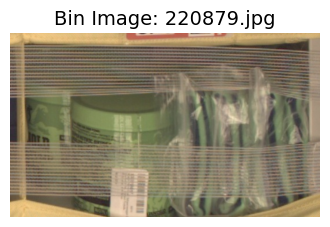


=== RAW RESULT (pprint) ===
[{'asin': 'B001G0N70I',
  'name': 'Polar Ice Standard Knee Wrap, Cold Therapy Ice Pack, Universal Size '
          '(Color may vary)',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.8252570629119873,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00FCGLHKE',
  'name': 'Muscle Pharm Arnold Schwarzenegger Series Iron Pump Pre-Workout '
          'Formula, Watermelon, 6.35 Ounce',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 3.1362669467926025,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/34853.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/34853.json


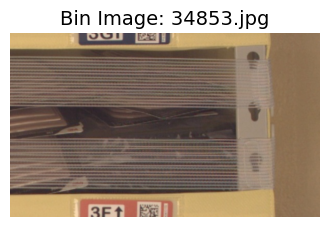


=== RAW RESULT (pprint) ===
[{'asin': 'B000BOC9K4',
  'name': '3M 357 Bondo Spreader, 3 Pack',
  'required_qty': 9,
  'predicted_qty': 1,
  'max_similarity': 2.8877925872802734,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00VR5O29C',
  'name': 'DR JEKYLL by PROSUPPS New Improved flavor Extreme Pump Pro Supps '
          '11.3 oz (Orange Burst)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8412833213806152,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01AU8YAOS',
  'name': 'JollyGear Knee Brace Support Open Patella Stabilizer for ACL '
          'Arthritis and Sports (Black, One Size)',
  'required_qty': 5,
  'predicted_qty': 1,
  'max_similarity': 2.557446002960205,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/254629.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/

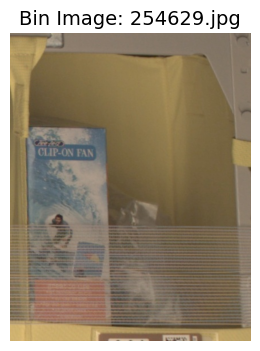


=== RAW RESULT (pprint) ===
[{'asin': 'B00AF0OIJ4',
  'name': 'Cosmas 774ORB Oil Rubbed Bronze Cabinet Hardware Swirl Handle Pull '
          '- 3" Hole Centers - 25 Pack',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.77085542678833,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00FFADO8A',
  'name': 'Thermos Stainless King 16-Ounce Travel Tumbler, Cranberry',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7921717166900635,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00KHWBSIE',
  'name': 'Dreambaby Stroller Fan - Purple/White',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.762570381164551,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/345730.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/345730.json


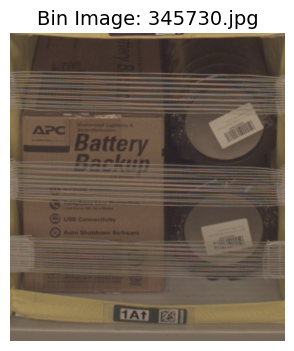


=== RAW RESULT (pprint) ===
[{'asin': 'B0000ZQTCS',
  'name': 'APC BACK-UPS CS BK500BLK 500VA/300W UPS System',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.5159738063812256,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B015S9YQFC',
  'name': 'Rock Foam Roller Deep Tissue Massage AccuPoint Roller (Black, 13 '
          'Inches)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.90212345123291,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/104701.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/104701.json


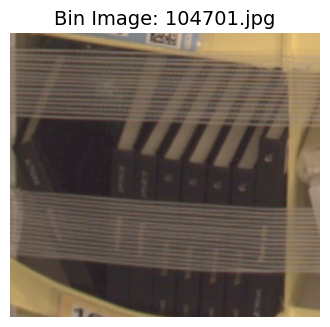


=== RAW RESULT (pprint) ===
[{'asin': '0691157669',
  'name': 'Weiwei-isms',
  'required_qty': 16,
  'predicted_qty': 1,
  'max_similarity': 2.736151695251465,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B010C4AJNQ',
  'name': 'Lotus Natural Products - Indian Healing Clay Mask - Organic '
          'Magnetic Calcium Bentonite Clay for External Detox Use',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.78548002243042,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/352391.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/352391.json


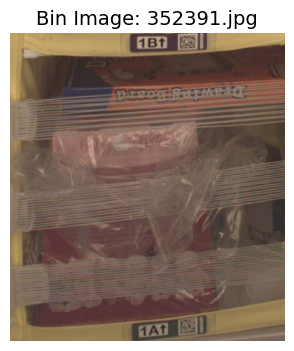


=== RAW RESULT (pprint) ===
[{'asin': 'B00114M520',
  'name': 'Janlynn Counted Cross Stitch Kit, Girls with Cosmos',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.0777902603149414,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B001E8F912',
  'name': 'Manhattan Toy Baby Stella Black Hair Soft Nurturing First Baby Doll',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8575167655944824,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0029JU348',
  'name': 'Pillsbury Specialty Mix Hot Roll, 16-Ounce Boxes (Pack of 6)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.489198923110962,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B019FFC0IU',
  'name': 'Magna Magnetic Drawing Board - Erasable Doodle Pad Pro for Kids & '
          'Toddlers',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6680517196655273,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVER

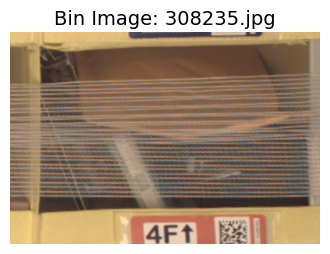


=== RAW RESULT (pprint) ===
[{'asin': 'B005T8PFW6',
  'name': 'HDMI, Displayport & DVI Connectors RA DVI RECEPTACLE (1 piece)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7512049674987793,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00DED0OX8',
  'name': 'TE Connectivity W28-XT1A-15 Circuit Breaker; Therm; Push; Cur-Rtg '
          '15A; 1 Pole; Snap-In Panel; W28 Series TE/Tyco/Potter & Brumfield',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8152973651885986,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00GVEKLY4',
  'name': 'Flash Point Fire Rescue: Veteran and Rescue Dog Accessory Pack',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.842637538909912,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B00YBB6W7E',
  'name': 'MPERO Microsoft Lumia 640 Wallet Case, [Flex Flip] Cover with Card '
          'Slots and Wrist Strap (Mint Green)',
  'required_qty': 1,
  'pr

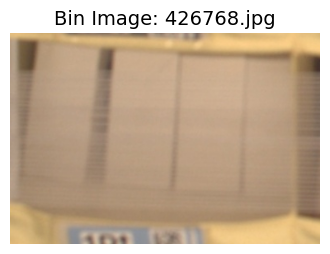


=== RAW RESULT (pprint) ===
[{'asin': 'B00UKXP6Y2',
  'name': 'Honsky&reg; Cute Thumbs Up Adjustable TPU Flexible Mobile Cell '
          'Phone Tablet Computer Kindle Fire Display Stand Holder for Bed '
          'Desk, iPad Mini iPhone 7 6S Plus ?Samsung 7 S6 Edge ¨C 2 Pack, Blue '
          '& Black',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.585576057434082,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/412075.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/412075.json


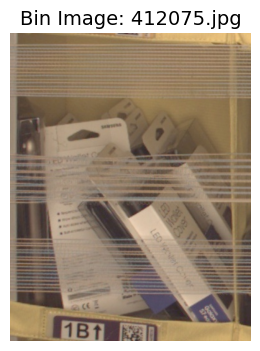


=== RAW RESULT (pprint) ===
[{'asin': 'B010STED8W',
  'name': 'SG Design iPhone6 Plus Case, Lighting Alu Series for iPhone 6 Plus '
          '[ 5.5-Inch] Dual Layer with Brushed Metal Style Shell Gold - Gold',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7332358360290527,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01B1WDK2U',
  'name': 'Samsung Galaxy S7 edge Case LED View Flip Cover  - Black',
  'required_qty': 8,
  'predicted_qty': 1,
  'max_similarity': 2.7399189472198486,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/224721.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/224721.json


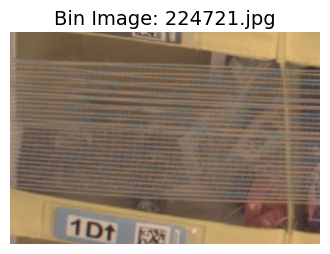


=== RAW RESULT (pprint) ===
[{'asin': 'B00BTD5Y9E',
  'name': 'Best Portable Electro Massage Therapy Device TENS unit 6 Modes FDA '
          'CLEARED HealthmateForever Total Full body Pain Relief Machine '
          'Devices for Neck Shoulder Muscle Sore Joint Lower Back Pain '
          'Electric Impulse Body Massager HM6GL Great Massage Tool for Pain '
          'Relief! Lifetime Warranty! (Blue)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.69472336769104,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01422FJMK',
  'name': 'Usmile® USB 100KHz-1.7GHz VHF UHF Band RTL SDR+UpConverter SDR '
          'Receiver NFM FM DSB LSB CW for sdr radio',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.9958550930023193,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01GHATFQG',
  'name': 'Usmile® 8pcs 2204 2205 2206 Motor Guard Protector Caps Universal '
          'Landing Skid Kit Gear for QAV250 ZMR250 XR215 DL220 Rac

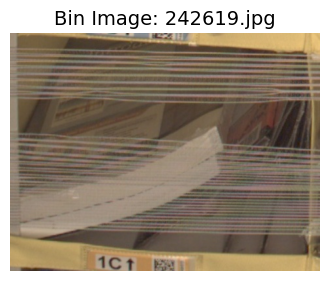


=== RAW RESULT (pprint) ===
[{'asin': '097231430X',
  'name': 'Hearing Conservation Manual, 4th ed',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2368061542510986,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': '1111532613',
  'name': 'Introduction to Corporate Finance: What Companies Do, Abridged '
          'Edition (with Economic CourseMate with eBook Printed Access Card '
          'and Thomson ONE Business School Edition 6-month Printed Access '
          'Card)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1934032440185547,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B0002AQCKA',
  'name': 'Zoo Med ReptiTherm® Under Tank Heater, Small',
  'required_qty': 5,
  'predicted_qty': 1,
  'max_similarity': 3.3581933975219727,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/392094.jpg
📄 JSON :  /

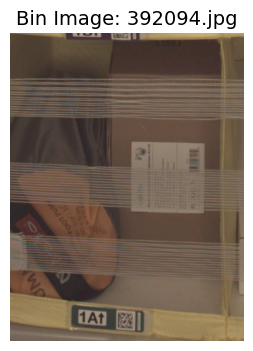


=== RAW RESULT (pprint) ===
[{'asin': 'B016UCNP08',
  'name': 'IP Camera PTZ Reolink 4MP 1440P POE PTZ Security Camera 4X Optical '
          'Motorized Zoom Outdoor Speed Dome ??',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.1577601432800293,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B019X2Y67I',
  'name': 'Nemo Nomad 30 XL Air Sleeping Matress',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.049071788787842,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/233693.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/233693.json


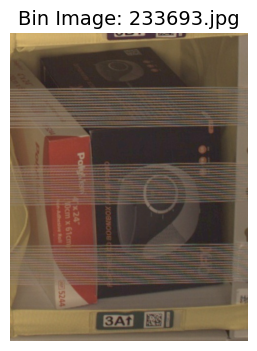


=== RAW RESULT (pprint) ===
[{'asin': 'B001K1EQOY',
  'name': 'Box of 4 PolyMem QuadraFoam 4 x 24" roll Nonadhesive FERRIS MFG. '
          'CORP. 5244',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.2411251068115234,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00J6E7UTK',
  'name': 'QFX J-51BK Portable AM/FM Radio CD Player - Black',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.762089967727661,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/386709.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/386709.json


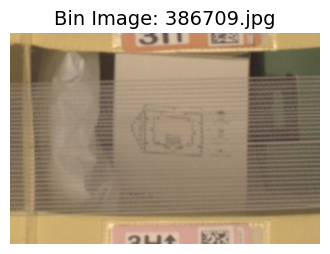


=== RAW RESULT (pprint) ===
[{'asin': 'B00IAVDOS6',
  'name': 'Xbox One Stereo Headset Adapter',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7852494716644287,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00SNER8R8',
  'name': 'COACH Signature Jacquard Corner Zip Clutch LI/Khaki/Brown',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 3.028123617172241,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B01ABVEFSA',
  'name': 'Litom Solar Powered Wireless 8 LED Security Motion Sensor Lamp '
          'Outdoor Light (2 Pack)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.7591142654418945,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/175092.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/175092.json


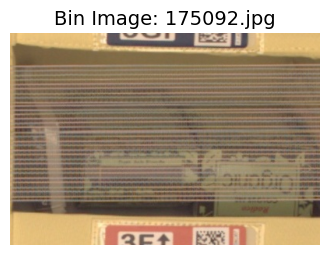


=== RAW RESULT (pprint) ===
[{'asin': 'B013KIOTNC',
  'name': '[TeleSkins] - Salt Lake LDS Mormon Temple - iPhone 6 Plus / iPhone '
          '6S Plus Case - Ultra Durable Slim Fit,Protective Plastic Snap On '
          'Back Case / Cover for Girls [Fits (5.5 ") only]',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.852579355239868,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B019ZZEFVU',
  'name': 'Radico Colour Me Organic (Dark Ash Blonde)',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 3.0393664836883545,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B01FHKDZ4A',
  'name': 'Kakanuo G9 LED Bulb Dimmable 4 Watt Cool White 6000K Bi-pin Base '
          '72X3014SMD LED Corn Bulb AC 110V(Pack of 6)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6464598178863525,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T

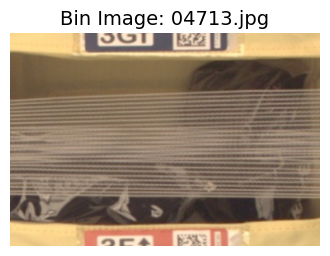


=== RAW RESULT (pprint) ===
[{'asin': 'B011IISNJW',
  'name': 'Womens Weightlifting Gloves plus FREE Padded Figure 8 Lifting '
          'Straps for Powerlifting-Gym-Crossfit-Weight '
          'Training-Biking-Cycling-Best for Comfort-Grip and Callus '
          'Protection-Washable-*FREE* Fox Fierce Fitness Workout for Women '
          'Ebook',
  'required_qty': 2,
  'predicted_qty': 1,
  'max_similarity': 2.457489252090454,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/377456.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/377456.json


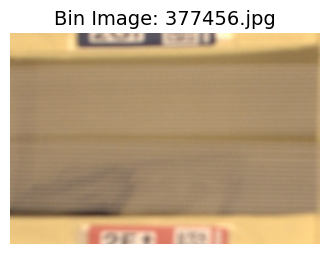


=== RAW RESULT (pprint) ===
[{'asin': 'B00H7KJTMG',
  'name': 'Walking With Dinosaurs',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.6699442863464355,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0},
 {'asin': 'B00UGTBXHO',
  'name': '2015 Samsung Galaxy A3 Case, Terrapin [Extra Slim Fit] Hybrid '
          'Rubberized [Black] Protective Hard Case for Samsung Galaxy A3 - '
          'Black (not for 2nd Gen Galaxy A3 2016)',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.296178102493286,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ✔ PASS


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/02135.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/02135.json


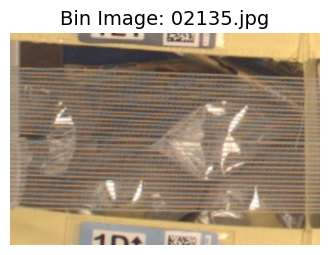


=== RAW RESULT (pprint) ===
[{'asin': 'B00CEQLJ8U',
  'name': 'Water Sports Water Balloon Refill Kit, 500-Pack',
  'required_qty': 3,
  'predicted_qty': 1,
  'max_similarity': 2.6912686824798584,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B0170MDAHA',
  'name': 'Top to Toe Wellness 28 Day Detox Tea | Body Cleansing, Metabolism '
          'Boosting, Promote Slimming, Reduce Bloating, Relieve Constipation, '
          'Increase Energy, Cleanse Liver, Organic Loose Leaf Herbal Detox Tea',
  'required_qty': 4,
  'predicted_qty': 1,
  'max_similarity': 2.873302459716797,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/38542.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/38542.json


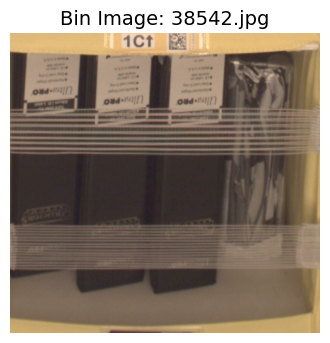


=== RAW RESULT (pprint) ===
[{'asin': 'B0002TT36G',
  'name': 'Ultra Pro 3" Collectors Album (Black)',
  'required_qty': 6,
  'predicted_qty': 1,
  'max_similarity': 3.048816442489624,
  'patch_hits': 36,
  'pass': False,
  'ocr_hits': 0},
 {'asin': 'B016YFCTLC',
  'name': 'Clara Clark® Camouflage Collection Gray CAMO Printed 4 Piece Bed '
          'Sheet Set Natural, Queen Size',
  'required_qty': 1,
  'predicted_qty': 1,
  'max_similarity': 2.8554868698120117,
  'patch_hits': 36,
  'pass': True,
  'ocr_hits': 0}]

🔍 OVERALL: ❌ FAIL


🖼️ Image: /kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1/186412.jpg
📄 JSON :  /kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1/186412.json


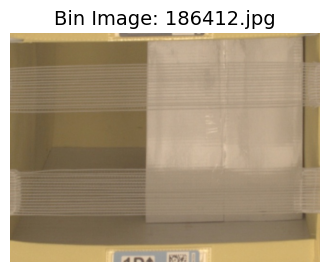

KeyboardInterrupt: 

In [35]:
import random
import glob
from pathlib import Path
import pprint

IMG_DIR = "/kaggle/input/amazon/sub_bin_images_1-20251122T061409Z-1-001/sub_bin_images_1"
JSON_DIR = "/kaggle/input/amazon/sub_metadata_1-20251122T061438Z-1-001/sub_metadata_1"

# gather images
all_imgs = sorted(glob.glob(f"{IMG_DIR}/*.jpg"))
print("Total images found:", len(all_imgs))

# pick 50 random
sample_imgs = random.sample(all_imgs, 250)

print("\n=== Evaluating 50 images ===\n")

for img_path in sample_imgs:
    stem = Path(img_path).stem
    json_path = f"{JSON_DIR}/{stem}.json"

    print(f"🖼️ Image: {img_path}")
    print(f"📄 JSON :  {json_path}")

    # preview image
    show_bin_image(img_path, size=(4,4))

    if not Path(json_path).exists():
        print("❌ JSON missing, skipping...\n" + "="*80 + "\n")
        continue

    try:
        results, overall = verify_bin(img_path, json_path, grid=(6,6), threshold=0.30)

        print("\n=== RAW RESULT (pprint) ===")
        pprint.pp(results)

        print("\n🔍 OVERALL:", "✔ PASS" if overall else "❌ FAIL")

    except Exception as e:
        print("🔥 ERROR:", e)

    print("\n" + "="*80 + "\n")
